In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [27]:
%cd /gdrive/MyDrive/CSE582/
!pwd
!unzip recipes_w_search_terms.csv.zip

/gdrive/MyDrive/CSE582
/gdrive/MyDrive/CSE582
Archive:  recipes_w_search_terms.csv.zip
replace recipes_w_search_terms.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: recipes_w_search_terms.csv  a



**Dataset Exploration**

In [28]:
# load dataframes and columns 

# ====== imports ====== 

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')


from wordcloud import WordCloud

In [29]:
# !ls

data = pd.read_csv('dataset/recipes_w_search_terms.csv')
data.head()

,id,name,description,ingredients,ingredients_raw_str,serving_size,servings,steps,tags,search_terms
0,96313,Grilled Garlic Cheese Grits,"We love grits, this is another good way to ser...","['water', 'grits', 'salt', 'cheddar cheese', '...","[""4 cups water"",""1 cup uncooked old f...",1 (155 g),8,"['I a sauce pan, bring water to a boil; slowly...","['time-to-make', 'course', 'main-ingredient', ...","{'diabetic', 'low-calorie', 'vegetarian', 'low..."
1,232037,Simple Shrimp and Andouille Jambalaya,"Simple, easy and very tasty for when you are i...","['onion', 'red bell pepper', 'garlic cloves', ...","[""1 medium onion, chopped coarse "",""1 m...",1 (366 g),4,"['In a food processor, pulse the onion, red pe...","['60-minutes-or-less', 'time-to-make', 'course...","{'dinner', 'shrimp'}"
2,41090,black-and-white bean salad,NaN,"['white beans', 'canned black beans', 'tomatoe...","[""1 cup canned white beans, rinsed and dra...",1 (807 g),1,"['In a large bowl, combine beans, tomato, onio...","['15-minutes-or-less', 'time-to-make', 'course...","{'vegetarian', 'salad', 'side', 'dinner', 'veg..."
3,60656,Crock Pot Italian Zucchini,This is a good recipe for weight watchers. It ...,"['zucchini', 'yellow squash', 'diced tomatoes'...","[""2 zucchini, sliced "",""2 small yel...",1 (244 g),4,['Put all ingredients in the crock pot and coo...,"['weeknight', 'time-to-make', 'course', 'main-...","{'side', 'vegetarian', 'italian'}"
4,232047,Beef Stew With Dried Cherries,This is a fabulous stew that came from one of ...,"['beef stew meat', 'flour', 'salt', 'allspice'...","[""3 lbs beef stew meat"",""3 tablespoons ...",1 (358 g),8,"['Preheat oven to 350°F.', ""Cut beef into 1 in...","['time-to-make', 'course', 'main-ingredient', ...",{'dinner'}


In [30]:
# Number of recipes
data.shape

# Dataset description
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 494963 entries, 0 to 494962
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   id                   494963 non-null  int64 
 1   name                 494963 non-null  object
 2   description          485365 non-null  object
 3   ingredients          494963 non-null  object
 4   ingredients_raw_str  494963 non-null  object
 5   serving_size         494963 non-null  object
 6   servings             494963 non-null  int64 
 7   steps                494963 non-null  object
 8   tags                 494963 non-null  object
 9   search_terms         494963 non-null  object
dtypes: int64(2), object(8)
memory usage: 37.8+ MB


In [31]:
var = [' '" ".join(word for word in data['name'].astype(str))]
var

['Grilled Garlic Cheese Grits  Simple Shrimp and Andouille Jambalaya  black-and-white bean salad  Crock Pot Italian Zucchini  Beef Stew With Dried Cherries  Hot Sweet Almond Brittle  Retro Chicken &amp; Chips Casserole  Asparagus  Omelette Wraps  Potato-Crab Chowder  Sweet and Simple Sloppy Joes  Golden Chocolate Chip Muffins  Potato Chip Chocolate Chip Cookies  Steak Au Poivre  Mushroom Ravioli  Layered Ice Cream &quot;cake&quot;  Santa Fe-Tastic Chicken Tortilla Soup  Scarlett\'s Crock Pot Cheese (And Prawn) Fondue 2 Die 4!  Mashed Plantains With Leeks and Fresh Herbs  Kosher Jewish  Pickles  Mexican Macaroni and Beef  Pantry Clearing Chili Bean Soup  Ras El Hanout  Silky Chocolate Kefir Tarts  Mushroom Lasagna: Gluten Free and Pasta Free!  Creme Brulee  Simple Garlic &amp; Pepper Rack of Lamb  Chocolate Biscuits  Ridiculously Easy Chicago-Style Pizza Pie  Makrout a Louz - Algerian Almond Cakes #2  Shrimp Stir-Fry  Double Pork, Double Cheese Burgers  Brain Cookies With Blood Glaze  D

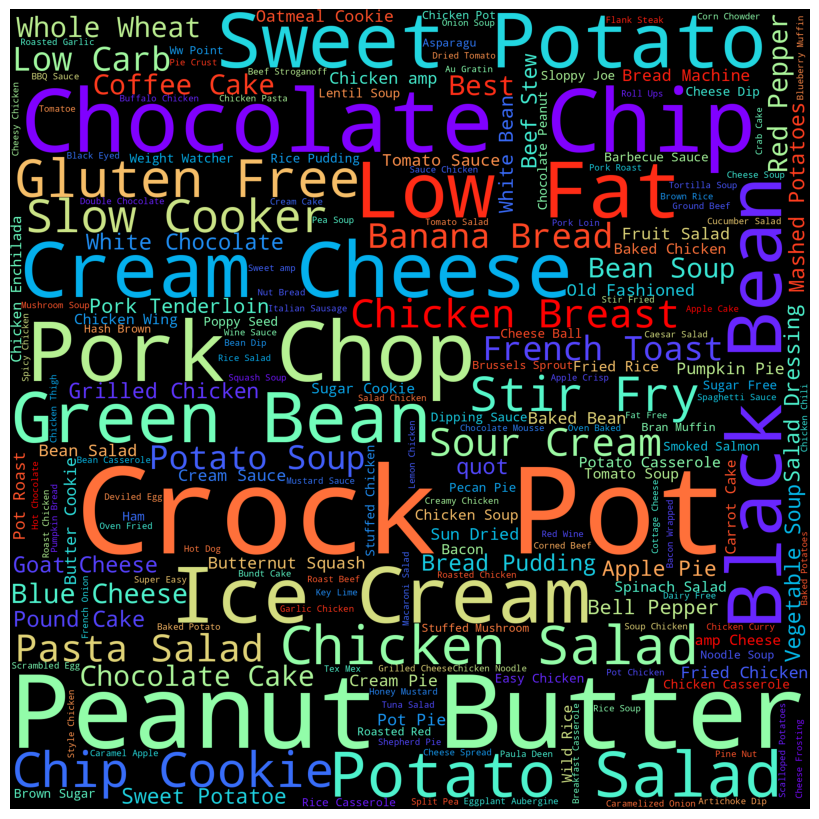

In [34]:
var=var[0]
wordcloud=WordCloud(width = 2000, height = 2000, 
                background_color ='black', colormap = 'rainbow',collocation_threshold=4,
                min_font_size = 20).generate(var)
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()